In [2]:
import numpy as np
import pandas as pd
from pprint import pprint

# from m6_qlib_util import WeightProvidedStrategy

import qlib
from qlib.constant import REG_US
from qlib.contrib.report import analysis_position
from qlib.contrib.strategy.optimizer import PortfolioOptimizer
from qlib.contrib.report import analysis_model

In [3]:
provider_uri = "~/.qlib/qlib_data/us_data_made"  # target_dir
qlib.init(provider_uri=provider_uri, region=REG_US)
opt_strategy_list = {"min_var": "gmv", "mean_var": "mvo",
                     "risk_par": "rp", "inv_vol": "inv"}
strategy = opt_strategy_list["mean_var"]
risk_factor = 10
load_file_no = 6

[20028:MainThread](2024-03-25 20:04:04,516) INFO - qlib.Initialization - [config.py:416] - default_conf: client.
[20028:MainThread](2024-03-25 20:04:05,401) INFO - qlib.Initialization - [__init__.py:74] - qlib successfully initialized based on client settings.
[20028:MainThread](2024-03-25 20:04:05,402) INFO - qlib.Initialization - [__init__.py:76] - data_path={'__DEFAULT_FREQ': WindowsPath('C:/Users/chuaxu/.qlib/qlib_data/us_data_made')}


In [4]:
# tickers
stock = ['SPX', 'AAPL', 'MSFT', 'GOOGL', 'AMZN', 'TSLA', 'NVDA', 'META', 'BRK-B', 'UNH', 'JNJ']
index = "SPX"

In [10]:
full_mean = pd.read_csv(f"../data/out_filter_mean_{load_file_no}.csv",
                        index_col=0, parse_dates=["t"])
full_mean.index = pd.to_datetime(full_mean.index)
# Replace the index by the next row
# full_mean.index = full_mean.index.shift(1, freq="B")
full_mean.drop(labels=["LeadStep", "RowID"], axis=1, inplace=True)
# full_mean = full_mean.div(100)
full_mean.columns = stock
full_mean.head(10)

,SPX,AAPL,MSFT,GOOGL,AMZN,TSLA,NVDA,META,BRK-B,UNH,JNJ
t,,,,,,,,,,,
2019-01-03,0.003140,-0.002859,-0.005783,-0.002357,0.014433,-0.008644,0.006052,0.006692,-0.007921,-0.006088,0.001060
2019-01-04,0.002209,-0.004503,-0.006224,-0.005248,0.008115,-0.008241,0.004269,0.006844,-0.007678,-0.005184,0.000714
2019-01-07,0.002348,-0.002564,-0.004266,-0.003577,0.007347,-0.006290,0.007830,0.007628,-0.006935,-0.001448,-0.000898
2019-01-08,0.002214,-0.002151,-0.003923,-0.004182,0.009380,-0.008943,0.003515,0.007012,-0.009646,-0.003591,-0.001000
2019-01-09,0.002096,0.000161,-0.004349,-0.002928,0.009479,-0.006986,0.003169,0.006583,-0.006561,-0.003265,0.000631
2019-01-10,0.001783,-0.000779,-0.001833,-0.003442,0.008564,-0.007695,0.004470,0.007229,-0.007084,-0.004714,0.000611
2019-01-11,0.001261,-0.001520,-0.002507,-0.001741,0.007955,-0.005602,0.004236,0.004580,-0.005706,-0.002742,-0.002266
2019-01-14,0.001298,0.000657,-0.004425,-0.002301,0.010149,-0.006369,0.005193,0.006168,-0.006951,-0.001787,-0.001334
2019-01-15,0.001874,-0.000207,-0.003904,-0.002083,0.008732,-0.006099,0.005243,0.006052,-0.005532,-0.002269,-0.000809


In [11]:
full_cov = pd.read_csv(f"../data/out_filter_cov_{load_file_no}.csv",
                        index_col=0, parse_dates=["t"])
full_cov.drop(labels=["LeadStep", "VarName", "VarID", "RowID"], axis=1, inplace=True)
# full_cov.index = full_cov.index.shift(1, freq="B")
# full_cov = full_cov.div(10000)
full_cov.columns = stock
full_cov.head(10)

,SPX,AAPL,MSFT,GOOGL,AMZN,TSLA,NVDA,META,BRK-B,UNH,JNJ
t,,,,,,,,,,,
2019-01-03,0.386928,-0.002173,-0.001246,0.004826,-0.002242,-0.001160,-0.001231,0.002755,-0.004348,0.008045,0.000443
2019-01-03,-0.002173,0.384386,0.000991,0.002241,-0.006992,0.000156,0.004609,-0.003920,0.002576,0.005315,-0.002330
2019-01-03,-0.001246,0.000991,0.373152,0.002358,-0.000170,-0.001044,-0.005355,0.009154,0.001147,-0.003463,0.002465
2019-01-03,0.004826,0.002241,0.002358,0.381878,0.000239,0.002916,-0.006856,-0.002070,0.006355,-0.000394,0.002802
2019-01-03,-0.002242,-0.006992,-0.000170,0.000239,0.383791,-0.001965,0.000482,0.000740,-0.007948,0.003152,-0.000129
2019-01-03,-0.001160,0.000156,-0.001044,0.002916,-0.001965,0.392541,-0.002679,0.003520,-0.004005,-0.002784,-0.002031
2019-01-03,-0.001231,0.004609,-0.005355,-0.006856,0.000482,-0.002679,0.385350,0.002946,-0.007565,0.003159,0.005183
2019-01-03,0.002755,-0.003920,0.009154,-0.002070,0.000740,0.003520,0.002946,0.385909,-0.005433,0.000918,0.000264
2019-01-03,-0.004348,0.002576,0.001147,0.006355,-0.007948,-0.004005,-0.007565,-0.005433,0.373811,-0.004091,-0.001185


In [56]:
time_index = full_mean.index
time_index

DatetimeIndex(['2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08',
               '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14',
               '2019-01-15', '2019-01-16',
               ...
               '2022-12-15', '2022-12-16', '2022-12-19', '2022-12-20',
               '2022-12-21', '2022-12-22', '2022-12-23', '2022-12-27',
               '2022-12-28', '2022-12-29'],
              dtype='datetime64[ns]', name='t', length=1006, freq=None)

In [57]:
backtest_start_date = pd.Timestamp("2021-01-01")
backtest_end_date = pd.Timestamp("2022-12-31")
new_time_index = time_index[time_index <= backtest_end_date]
new_time_index = new_time_index[new_time_index >= backtest_start_date]
new_time_index

DatetimeIndex(['2021-01-04', '2021-01-05', '2021-01-06', '2021-01-07',
               '2021-01-08', '2021-01-11', '2021-01-12', '2021-01-13',
               '2021-01-14', '2021-01-15',
               ...
               '2022-12-15', '2022-12-16', '2022-12-19', '2022-12-20',
               '2022-12-21', '2022-12-22', '2022-12-23', '2022-12-27',
               '2022-12-28', '2022-12-29'],
              dtype='datetime64[ns]', name='t', length=502, freq=None)

In [58]:
mean = full_mean.loc[new_time_index]
cov = full_cov.loc[new_time_index]
print(mean.head(), "\n", cov.tail())


                 SPX      AAPL      MSFT     GOOGL      AMZN      TSLA  \
t                                                                        
2021-01-04  0.001043  0.003026  0.001895 -0.000127  0.001591  0.004070   
2021-01-05  0.000762  0.002635  0.001400 -0.000321  0.001282  0.003619   
2021-01-06  0.000853  0.002775  0.001401 -0.000231  0.001460  0.003620   
2021-01-07  0.001049  0.002250  0.000798 -0.000361  0.001063  0.002763   
2021-01-08  0.001188  0.002696  0.001416 -0.000015  0.001018  0.005275   

                NVDA      META     BRK-B       UNH       JNJ  
t                                                             
2021-01-04  0.003327  0.000966  0.002650  0.003325  0.002743  
2021-01-05  0.003419  0.000763  0.002526  0.003274  0.002665  
2021-01-06  0.004217  0.000834  0.002488  0.002791  0.002802  
2021-01-07  0.001769  0.000527  0.002569  0.003408  0.002820  
2021-01-08  0.004303  0.000775  0.002638  0.003725  0.002834   
                  SPX      AAPL        

In [59]:
n_stocks = len(stock)
# w0 = np.ones((len(stock), 1)) * (1 / n_stocks)
w0 = np.zeros((len(stock), 1))
port = PortfolioOptimizer(method=strategy, lamb=risk_factor)
weights = []

for i in range(mean.shape[0]):
    expect_return = mean.iloc[i, :].values.reshape(-1, 1)
    cov_m = cov.iloc[i*n_stocks:(i+1)*n_stocks, :].values
    temp = port.__call__(cov_m, expect_return, w0)
    weights.extend(temp)

### NVIDIA only
# for i in range(mean.shape[0]):
#     temp = np.zeros((len(stock), 1))
#     temp[6] = 1
#     weights.extend(temp)

c:\Users\chuaxu\OneDrive - SAS\Projects\qlib\qlib_env\lib\site-packages\qlib\contrib\strategy\optimizer\optimizer.py:263: UserWarning:

optimization not success (9)

c:\Users\chuaxu\OneDrive - SAS\Projects\qlib\qlib_env\lib\site-packages\qlib\contrib\strategy\optimizer\optimizer.py:263: UserWarning:

optimization not success (8)

c:\Users\chuaxu\OneDrive - SAS\Projects\qlib\qlib_env\lib\site-packages\qlib\contrib\strategy\optimizer\optimizer.py:263: UserWarning:

optimization not success (3)



In [60]:
iterables = [new_time_index, stock]
index = pd.MultiIndex.from_product(iterables, names=["datetime", "instrument"])
final_weights = pd.DataFrame(weights, index=index, columns=["score"])
print(final_weights.head(15), "\n", final_weights.tail(15))

                              score
datetime   instrument              
2021-01-04 SPX         3.244293e-16
           AAPL        5.770977e-12
           MSFT        1.870263e-14
           GOOGL       5.483266e-13
           AMZN        3.399071e-13
           TSLA        2.612202e-01
           NVDA        1.559320e-01
           META        6.204369e-13
           BRK-B       2.264802e-17
           UNH         5.828478e-01
           JNJ         1.035777e-10
2021-01-05 SPX         1.056565e-12
           AAPL        2.610096e-12
           MSFT        1.162674e-12
           GOOGL       1.467616e-12 
                               score
datetime   instrument              
2022-12-28 META        4.330411e-18
           BRK-B       3.030132e-17
           UNH         1.445259e-17
           JNJ         8.786637e-01
2022-12-29 SPX         1.424155e-13
           AAPL        2.656730e-14
           MSFT        2.718916e-13
           GOOGL       2.600958e-13
           AMZN        2.9

<Axes: title={'center': 'Positions'}, xlabel='datetime'>

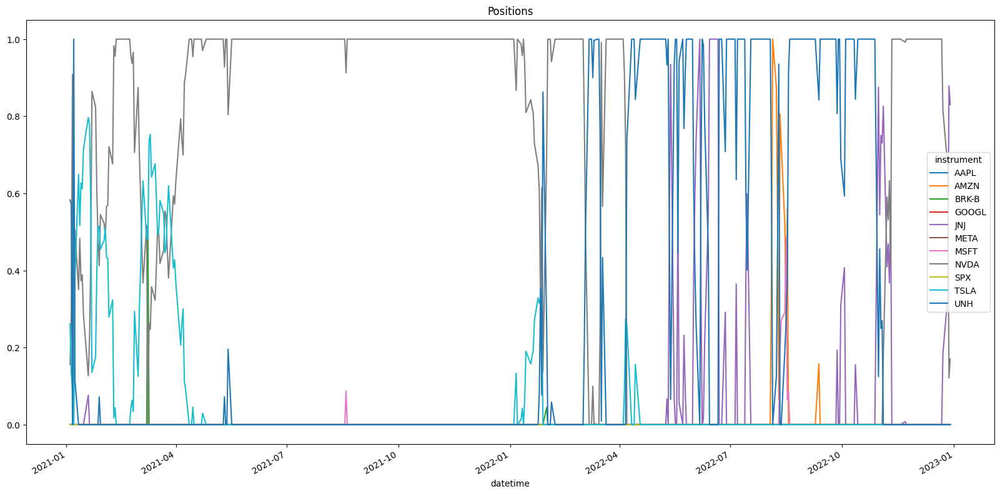

In [62]:
plot_final_weights_unstacked = final_weights['score'].unstack('instrument')
plot_final_weights_unstacked.plot(kind='line', figsize=(20, 10), title="Positions")

In [12]:
# Load the close_prices.csv
close_prices = pd.read_csv("../data/close_prices.csv", index_col=0, parse_dates=True)
# select the data from 2021-01-01 to 2022-12-31
close_prices = close_prices.loc[backtest_start_date:backtest_end_date]
close_prices.head(10)

NameError: name 'backtest_start_date' is not defined

In [64]:
# Calculate daily percentage change
daily_returns = close_prices.pct_change()
# replace the NaN with 0
daily_returns.fillna(0, inplace=True)
# replace the "SPY" with "SPX"
daily_returns = daily_returns.rename(columns={"SPY": "SPX"})
daily_returns.head(10)

,SPX,AAPL,MSFT,GOOGL,AMZN,TSLA,NVDA,META,BRK-B,UNH,JNJ
Date,,,,,,,,,,,
2021-01-04,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2021-01-05,0.006887,0.012364,0.000965,0.008064,0.010004,0.007317,0.022210,0.007548,-0.004290,-0.013448,0.011757
2021-01-06,0.005979,-0.033662,-0.025929,-0.009868,-0.024897,0.028390,-0.058953,-0.028269,0.012309,0.041966,0.009410
2021-01-07,0.014857,0.034123,0.028457,0.029869,0.007577,0.079447,0.057830,0.020622,0.011335,0.016033,0.003379
2021-01-08,0.005698,0.008631,0.006093,0.013239,0.006496,0.078403,-0.005040,-0.004354,0.004938,-0.004493,-0.002058
2021-01-11,-0.006741,-0.023249,-0.009699,-0.023106,-0.021519,-0.078214,0.025966,-0.040102,-0.002564,-0.007265,-0.004186
2021-01-12,0.000211,-0.001396,-0.011771,-0.010739,0.002126,0.047153,-0.010039,-0.022387,-0.001714,-0.009369,-0.007781
2021-01-13,0.002693,0.016227,0.006560,0.005652,0.014438,0.005851,0.003485,0.002190,0.006351,-0.006520,-0.001518
2021-01-14,-0.003502,-0.015127,-0.015346,-0.009346,-0.012136,-0.011014,-0.024498,-0.023844,0.002175,-0.012703,0.017480


<Axes: title={'center': 'Cumulative Returns of All Assets'}, xlabel='Date'>

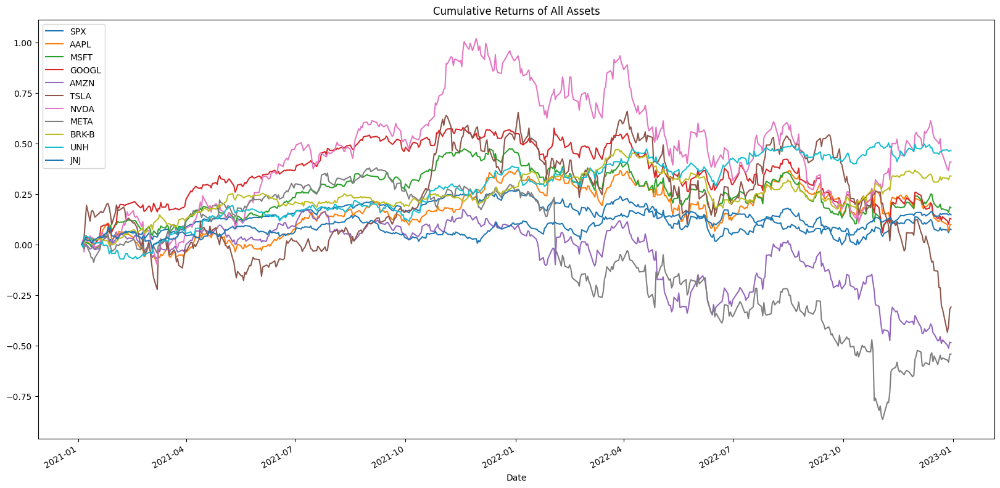

In [65]:
# calculate the cumulative returns with cumsum
cum_returns = daily_returns.cumsum()
# plot the cumulative returns.
cum_returns.plot(figsize=(20, 10), title="Cumulative Returns of All Assets", )

In [66]:
from qlib.utils.time import Freq
from qlib.utils import flatten_dict
from qlib.backtest import backtest, executor
from qlib.contrib.evaluate import risk_analysis

benchmark = stock
# benchmark = ["BRK-B"]

FREQ = "day"

STRATEGY_CONFIG = {
    "risk_degree": 1,
    "signal": final_weights
}

EXECUTOR_CONFIG = {
    "time_per_step": "day",
    "generate_portfolio_metrics": True,
}

backtest_config = {
    "start_time": backtest_start_date,
    "end_time": backtest_end_date,
    "account": 10000,
    "benchmark": benchmark,
    "exchange_kwargs": {
        "freq": FREQ,
        "deal_price": "close",
        "open_cost": 0.0005,
        "close_cost": 0.0015,
        "min_cost": 5,
    },
}

# strategy object
strategy_obj = WeightProvidedStrategy(**STRATEGY_CONFIG)
# executor object
executor_obj = executor.SimulatorExecutor(**EXECUTOR_CONFIG)
analysis_freq = "{0}{1}".format(*Freq.parse(FREQ))
portfolio_metric_dict, indicator_dict = backtest(executor=executor_obj, strategy=strategy_obj, **backtest_config)
report_normal, positions_normal = portfolio_metric_dict.get(analysis_freq)

[6808:MainThread](2024-03-20 14:53:05,369) WARNING - qlib.data - [data.py:666] - load calendar error: freq=day, future=True; return current calendar!
[6808:MainThread](2024-03-20 14:53:05,370) WARNING - qlib.data - [data.py:669] - You can get future calendar by referring to the following document: https://github.com/microsoft/qlib/blob/main/scripts/data_collector/contrib/README.md
[6808:MainThread](2024-03-20 14:53:05,376) WARNING - qlib.BaseExecutor - [executor.py:121] - `common_infra` is not set for <qlib.backtest.executor.SimulatorExecutor object at 0x00000240900EF520>
[6808:MainThread](2024-03-20 14:53:18,141) INFO - qlib.backtest caller - [__init__.py:93] - Create new exchange
[6808:MainThread](2024-03-20 14:53:40,627) WARNING - qlib.online operator - [exchange.py:219] - $close field data contains nan.
[6808:MainThread](2024-03-20 14:53:40,629) WARNING - qlib.online operator - [exchange.py:219] - $close field data contains nan.


backtest loop:   0%|          | 0/503 [00:00<?, ?it/s]

c:\Users\chuaxu\OneDrive - SAS\Projects\qlib\qlib_env\lib\site-packages\qlib\utils\index_data.py:481: RuntimeWarning:

Mean of empty slice

c:\Users\chuaxu\OneDrive - SAS\Projects\qlib\qlib_env\lib\site-packages\qlib\utils\index_data.py:481: RuntimeWarning:

Mean of empty slice

c:\Users\chuaxu\OneDrive - SAS\Projects\qlib\qlib_env\lib\site-packages\qlib\utils\index_data.py:481: RuntimeWarning:

Mean of empty slice

c:\Users\chuaxu\OneDrive - SAS\Projects\qlib\qlib_env\lib\site-packages\qlib\utils\index_data.py:481: RuntimeWarning:

Mean of empty slice

c:\Users\chuaxu\OneDrive - SAS\Projects\qlib\qlib_env\lib\site-packages\qlib\utils\index_data.py:481: RuntimeWarning:

Mean of empty slice

c:\Users\chuaxu\OneDrive - SAS\Projects\qlib\qlib_env\lib\site-packages\qlib\utils\index_data.py:481: RuntimeWarning:

Mean of empty slice

c:\Users\chuaxu\OneDrive - SAS\Projects\qlib\qlib_env\lib\site-packages\qlib\utils\index_data.py:481: RuntimeWarning:

Mean of empty slice

c:\Users\chuaxu\OneD

In [67]:
report_normal

,account,return,total_turnover,turnover,total_cost,cost,value,cash,bench
datetime,,,,,,,,,
2021-01-04,10000.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,10000.000000,-0.008322
2021-01-05,9985.000000,-1.818989e-16,9441.688952,0.944169,15.000000,0.001500,9441.688952,543.311048,0.006249
2021-01-06,10189.159919,2.144816e-02,11711.112307,0.227283,25.000000,0.001002,9909.325506,279.834413,-0.008950
2021-01-07,10535.873415,3.586893e-02,24634.178951,1.268315,43.760720,0.001841,10428.853138,107.020277,0.028867
2021-01-08,10550.077312,3.628740e-03,45276.184624,1.959212,67.788768,0.002281,10174.920590,375.156722,0.010186
...,...,...,...,...,...,...,...,...,...
2022-12-23,10955.760491,-8.664881e-03,823625.251338,0.000000,1848.559657,0.000000,10948.319403,7.441088,0.003838
2022-12-27,10164.561128,-7.130490e-02,827235.281243,0.329510,1858.559657,0.000913,10105.689930,58.871198,-0.026518
2022-12-28,10096.710821,-5.691373e-03,830369.181197,0.308316,1868.559657,0.000984,10093.819731,2.891090,-0.007295


In [68]:
analysis = dict()
analysis["return_without_cost"] = risk_analysis(report_normal["return"], freq=analysis_freq)
analysis["return_with_cost"] = risk_analysis(report_normal["return"] - report_normal["cost"], freq=analysis_freq)
analysis["bench"] = risk_analysis(report_normal["bench"], freq=analysis_freq)
analysis_df = pd.concat(analysis)  # type: pd.DataFrame
# log metrics
analysis_dict = flatten_dict(analysis_df["risk"].unstack().T.to_dict())

In [69]:
pprint(f"Risk Par Analysis:")
pprint(f"The following are analysis results of the excess return without cost({analysis_freq}).")
pprint(analysis["return_without_cost"])
pprint(f"The following are analysis results of the excess return with cost({analysis_freq}).")
pprint(analysis["return_with_cost"])
pprint(f"The following are analysis results of the benchmark({analysis_freq}).")
pprint(analysis["bench"])

'Risk Par Analysis:'
'The following are analysis results of the excess return without cost(1day).'
                       risk
mean               0.000769
std                0.027428
annualized_return  0.182910
information_ratio  0.432268
max_drawdown      -0.637253
'The following are analysis results of the excess return with cost(1day).'
                       risk
mean               0.000434
std                0.027421
annualized_return  0.103244
information_ratio  0.244055
max_drawdown      -0.703014
'The following are analysis results of the benchmark(1day).'
                       risk
mean               0.000081
std                0.016678
annualized_return  0.019212
information_ratio  0.074670
max_drawdown      -0.396157


In [70]:
report_normal

,account,return,total_turnover,turnover,total_cost,cost,value,cash,bench
datetime,,,,,,,,,
2021-01-04,10000.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,10000.000000,-0.008322
2021-01-05,9985.000000,-1.818989e-16,9441.688952,0.944169,15.000000,0.001500,9441.688952,543.311048,0.006249
2021-01-06,10189.159919,2.144816e-02,11711.112307,0.227283,25.000000,0.001002,9909.325506,279.834413,-0.008950
2021-01-07,10535.873415,3.586893e-02,24634.178951,1.268315,43.760720,0.001841,10428.853138,107.020277,0.028867
2021-01-08,10550.077312,3.628740e-03,45276.184624,1.959212,67.788768,0.002281,10174.920590,375.156722,0.010186
...,...,...,...,...,...,...,...,...,...
2022-12-23,10955.760491,-8.664881e-03,823625.251338,0.000000,1848.559657,0.000000,10948.319403,7.441088,0.003838
2022-12-27,10164.561128,-7.130490e-02,827235.281243,0.329510,1858.559657,0.000913,10105.689930,58.871198,-0.026518
2022-12-28,10096.710821,-5.691373e-03,830369.181197,0.308316,1868.559657,0.000984,10093.819731,2.891090,-0.007295


In [71]:
analysis_position.report_graph(report_normal)

In [72]:
analysis_position.risk_analysis_graph(analysis_df, report_normal)

In [73]:
stacked_expect_return = []
for i in range(mean.shape[0]-1):
    stacked_expect_return.extend(mean.iloc[i, :].values.T)
print(mean.head(15), "\n", mean.tail(15))

                 SPX      AAPL      MSFT     GOOGL      AMZN      TSLA  \
t                                                                        
2021-01-04  0.001043  0.003026  0.001895 -0.000127  0.001591  0.004070   
2021-01-05  0.000762  0.002635  0.001400 -0.000321  0.001282  0.003619   
2021-01-06  0.000853  0.002775  0.001401 -0.000231  0.001460  0.003620   
2021-01-07  0.001049  0.002250  0.000798 -0.000361  0.001063  0.002763   
2021-01-08  0.001188  0.002696  0.001416 -0.000015  0.001018  0.005275   
2021-01-11  0.001262  0.002783  0.001530  0.000131  0.001134  0.006665   
2021-01-12  0.001130  0.002415  0.001296 -0.000161  0.000812  0.006707   
2021-01-13  0.001129  0.002368  0.001019 -0.000296  0.000869  0.007185   
2021-01-14  0.001165  0.002565  0.001153 -0.000233  0.001135  0.006977   
2021-01-15  0.001100  0.002318  0.000800 -0.000354  0.000945  0.006755   
2021-01-19  0.000964  0.002097  0.000757 -0.000385  0.000844  0.006515   
2021-01-20  0.001073  0.002148  0.0011

In [13]:
"""
"score" is the expected return of the next day; "label" is the actual return of the next day. We need to shift the "score" by 1 day to match the "label".
The analysis_model.analysis_model_performance descendingly ranks the "score", then takes the mean of "label" for each group. 
"""
pred_df = final_weights[11:]
temp = pd.read_csv(f"../data/log_returns.csv", index_col=0, parse_dates=["t"])
pred_df["score"] = stacked_expect_return
pred_df["label"] = pd.DataFrame(temp.loc[new_time_index].values.flatten(), index=index, columns=["label"])
print(pred_df.head(15), "\n", pred_df.tail(15))

NameError: name 'final_weights' is not defined

In [75]:
analysis_model.analysis_model_performance.model_performance_graph(pred_df)